# Proyek Analisis Data: **Brazil E-Commerce Public Dataset**

- **Nama:** Muhammad Dendi Ardana
- **Email:** mdendiardana@gmail.com
- **ID Dicoding:** mdendiardana

## Menentukan Pertanyaan Bisnis

- Pertanyaan 1 : **Apa kategori produk dengan jumlah penjualan terbanyak selama periode data tersedia?**
- Pertanyaan 2 : **Bagaimana persebaran rating ulasan pelanggan?**
- Pertanyaan 3 : **Bagaimana rata-rata waktu pengiriman dari pembelian ke diterima Pelanggan?**
- Pertanyaan 4 : **Bagaimana distribusi metode pembayaran yang digunakan pelanggan pada transaksi?**
- Pertanyaan 5 : **Bagaimana tren jumlah pesanan bulanan dari tahun ke tahun**


## Import Semua Packages/Library yang Digunakan

In [308]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import datetime as dt

## Data Wrangling

In [309]:
# Memuat dataset Pelanggan

customers_df = pd.read_csv('https://drive.google.com/uc?id=1k51qFLyy5LcCY9mfbalctfimIgLqL-o7')
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [310]:
# Memuat dataset tabel orders
order_df = pd.read_csv('https://drive.google.com/uc?id=1eewQ3tuBERDlE-gd43PLZlt2ASRt1dfJ')
order_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [311]:
# membaca category products

category_df = pd.read_csv('https://drive.google.com/uc?id=1l9euhDUd8NNnBs6PEjqV3GkPX4DysfcD')
category_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [312]:
# orders items

order_item_df = pd.read_csv('https://drive.google.com/uc?id=1_e9iOx7rTrxzQwQonuoFmMcqhuqBywMa')
order_item_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [313]:
# membaca dataset product

product_df = pd.read_csv('https://drive.google.com/uc?id=1aFhLtw50lMmMyjRJigoj0gdnpeK-SgzQ')
product_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [314]:
# order reviews dataset

order_reviews_df = pd.read_csv('https://drive.google.com/uc?id=1bS9VUq6svgkSSMbba11eELjWUxhogPit')
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [315]:
# order payment dataset

order_payment_df = pd.read_csv('https://drive.google.com/uc?id=1H7V7fsy7JSqCOkZeE83JjyEkKitG5WUR')
order_payment_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [316]:
# Memuat dataset geolocation

geolocation_df = pd.read_csv('https://drive.google.com/uc?id=1u2G4djLTfM7XexBiGsj0P3OfmCpYUsIh')
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


**Insight:**
- Dataset yang digunakan terdiri dari beberapa file utama seperti `orders`, `order_items`, `products`, `product category translation`, `reviews`, `payments`,`customers`, `geolocation`. Semua dataset berhasil dimuat dan tidak mengalami error saat dibaca.






### Assessing Data

In [317]:
category_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [318]:
order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [319]:
# Mengecek apakah terdapat pada duplikasi data

print("Jumlah duplikasi: ", order_df.duplicated().sum())

Jumlah duplikasi:  0


In [320]:
order_item_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [321]:
order_payment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [322]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [323]:
# Mengecek apakah ada data duplikasi pada order_reviews_dataset

print("Jumlah duplikasi: ", order_reviews_df.duplicated().sum())

Jumlah duplikasi:  0


In [324]:
# mengecek parameter statistik pada order_reviews_dataset

order_reviews_df.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [325]:
order_reviews_df.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [326]:
product_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [327]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [328]:
# cek apakah ada baris duplikat
geo_duplicates = geolocation_df.duplicated().sum()
print(f"Jumlah baris duplikat persis: {geo_duplicates}")

Jumlah baris duplikat persis: 261831


**Insight:**
- `product_category_translation` memiliki 71 baris, Terdiri dari nama kategori dalam bahasa asli dan inggris dan Tidak ada nilai null
- `order_df` terdapat pada kolom `order_approved_at`, `order_delivered_carrier_date` dan `order_estimated_delivery_date` bernilai tipe object yang biasanya digunakan untuk tipe data string seharusnya di representasikan menjadi tipe data datetime tetapi tidak terdapat duplikasi data.
- `order_reviews` memiliki banyak missing values  seperti pada kolom `review_comment_title` dan `review_comment_message` jadi review pelanggan tersedia lengkap untuk skor, namun komentar tidak sepenuhnya tersedia.
- `order_reviews` juga terdapat tipe data object (biasanya digunakan untuk tipe data string) terdapat pada kolom `review_creation_date` dan `review_answer_timestamp` yang seharusnya di representasi menjadi tipe data datetime bukan object setelah itu tidak ada missing values maupun duplikasi data.
- `products_df`, dapat disimpulkan bahwa tidak terdapat masalah pada tipe data tiap kolom dalam `products_df`.  Selain itu, jumlah datanya juga telah lengkap sehingga kolom `product_category_name` ada null perlu di hubungkan ke product `product_category_name_translation` untuk label bahasa inggris
- `geolocation` dapat disimpulkan bahwa tidak terdapat missing values semua nilai bernilai non null disini aman untuk di lanjutkan analisis lebih lanjut. tetapi setelah di cek duplikasi nya terdapat data duplikat dan akan di lakukan cleaning data pada tahap cleaning data agar lebih nyaman di analisis.

### Cleaning Data

In [329]:
# Membersihkan data order_df

datetime_columns = ["order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date", "order_estimated_delivery_date"]
for column in datetime_columns:
    order_df[column] = pd.to_datetime(order_df[column], errors='coerce')

order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [330]:
# menangani missing values yang terdapat product_reviews_df
product_df_clean = product_df.dropna(subset=['product_category_name'])

# Gabungkan dengan category_df untuk dapat nama kategori dalam bahasa Inggris
product_df_clean = product_df_clean.merge(
    category_df,
    on='product_category_name',
    how='left'
)

In [331]:
# Gabungkan order_items_df dengan product yang sudah bersih dan ada nama kategori
orders_item_with_category = order_item_df.merge(
    product_df_clean[['product_id', 'product_category_name_english']],
    on='product_id',
    how='left')

orders_item_with_category = orders_item_with_category.dropna(subset=['product_category_name_english'])

In [332]:
# Membersihkan missing values order_reviews dan mengkonversi Tipe data datetime pada kolom review_creation_date dan review_answer_timestamp
order_reviews_df['review_creation_date'] = pd.to_datetime(order_reviews_df['review_creation_date'])
order_reviews_df['review_answer_timestamp'] = pd.to_datetime(order_reviews_df['review_answer_timestamp'])

# cek tipe data review creation_date dan review_answer_timestamp
order_reviews_df.info()

# Apakah masih ada massing value pada order_review_df
order_reviews_df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [333]:
# 5. Periksa distribusi review score
order_reviews_df['review_score'].value_counts().sort_index()

,count
review_score,
1,11424
2,3151
3,8179
4,19142
5,57328


In [334]:
# Menghapus data yang duplicates
geolocation_df[['geolocation_city', 'geolocation_state']].drop_duplicates().head()

,geolocation_city,geolocation_state
0,sao paulo,SP
5,são paulo,SP
10166,sao bernardo do campo,SP
22261,são paulo,RN
50999,jundiaí,SP


**Insight:**
- Dataset `order_df` mengandung informasi waktu penting seperti waktu pembelian, pengiriman, dan estimasi. Semua kolom waktu awalnya bertipe objek dan telah diubah menjadi datetime. Terdapat missing value di beberapa kolom seperti `order_delivered_customer_date`, yang diatasi dengan menghapus baris tersebut saat analisis durasi pengiriman dilakukan.

- dataset`order_reviews_df` yaitu terdapat missing values tetapi tidak memiliki duplikasi data dan nilainya tidak ada yang null. jadi analisis rating tetap valid.

- `order_reviews_df` kita juga perlu mengonversi tipe data tersebut menjadi datetime. dikarenakan dua kolom bertipe waktu pada dataset `order_reviews_df`, yaitu `review_creation_date` dan `review_answer_timestamp`,
telah dikonversi ke tipe data datetime. Hal ini memungkinkan analisis lanjutan seperti menghitung kecepatan balasan terhadap ulasan pelanggan.
- Dataset `geolocation_df` memiliki 1000163 entri dan tidak ada nilai null. Namun, terdapat 261831 baris duplikat persis, yang perlu ditangani jika analisis memerlukan data lokasi unik.

## Exploratory Data Analysis (EDA)

### Explore ...

In [335]:
# cek statistik dari data pelanggan

customers_df.describe(include="all")

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441.000000,99441,99441
unique,99441,96096,NaN,4119,27
top,274fa6071e5e17fe303b9748641082c8,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,17,NaN,15540,41746
mean,NaN,NaN,35137.474583,NaN,NaN
std,NaN,NaN,29797.938996,NaN,NaN
min,NaN,NaN,1003.000000,NaN,NaN
25%,NaN,NaN,11347.000000,NaN,NaN
50%,NaN,NaN,24416.000000,NaN,NaN
75%,NaN,NaN,58900.000000,NaN,NaN


In [336]:
# Mengecek parameter statistika mean, median, dll dari kolom numerik
order_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99281,97658,96476,99441
mean,2017-12-31 08:43:12.776581120,2017-12-31 18:35:24.098800128,2018-01-04 21:49:48.138278656,2018-01-14 12:09:19.035542272,2018-01-24 03:08:37.730111232
min,2016-09-04 21:15:19,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-09-30 00:00:00
25%,2017-09-12 14:46:19,2017-09-12 23:24:16,2017-09-15 22:28:50.249999872,2017-09-25 22:07:22.249999872,2017-10-03 00:00:00
50%,2018-01-18 23:04:36,2018-01-19 11:36:13,2018-01-24 16:10:58,2018-02-02 19:28:10.500000,2018-02-15 00:00:00
75%,2018-05-04 15:42:16,2018-05-04 20:35:10,2018-05-08 13:37:45,2018-05-15 22:48:52.249999872,2018-05-25 00:00:00
max,2018-10-17 17:30:18,2018-09-03 17:40:06,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-11-12 00:00:00


In [337]:
# cek parameter dataset order_item_df
print(order_item_df.describe())
print(order_item_df.shape)

# cek info dataset
order_item_df.info()

       order_item_id          price  freight_value
count  112650.000000  112650.000000  112650.000000
mean        1.197834     120.653739      19.990320
std         0.705124     183.633928      15.806405
min         1.000000       0.850000       0.000000
25%         1.000000      39.900000      13.080000
50%         1.000000      74.990000      16.260000
75%         1.000000     134.900000      21.150000
max        21.000000    6735.000000     409.680000
(112650, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freigh

In [338]:
# cek parameter dataset order_payment_df
print(order_payment_df.describe())
print(order_payment_df.shape)
order_payment_df.info()

       payment_sequential  payment_installments  payment_value
count       103886.000000         103886.000000  103886.000000
mean             1.092679              2.853349     154.100380
std              0.706584              2.687051     217.494064
min              1.000000              0.000000       0.000000
25%              1.000000              1.000000      56.790000
50%              1.000000              1.000000     100.000000
75%              1.000000              4.000000     171.837500
max             29.000000             24.000000   13664.080000
(103886, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  

In [339]:
order_reviews_df.describe()

,review_score,review_creation_date,review_answer_timestamp
count,99224.000000,99224,99224
mean,4.086421,2018-01-12 20:49:23.948238336,2018-01-16 00:23:56.977938688
min,1.000000,2016-10-02 00:00:00,2016-10-07 18:32:28
25%,4.000000,2017-09-23 00:00:00,2017-09-27 01:53:27.249999872
50%,5.000000,2018-02-02 00:00:00,2018-02-04 22:41:47.500000
75%,5.000000,2018-05-16 00:00:00,2018-05-20 12:11:21.500000
max,5.000000,2018-08-31 00:00:00,2018-10-29 12:27:35
std,1.347579,NaN,NaN


In [340]:
product_df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [341]:
# Membuat DataFrame baru untuk menampung semua informasi dari dataset sebelumnya
all_data = pd.merge(order_df, order_payment_df, on='order_id', how='left')
all_data = pd.merge(all_data, order_reviews_df, on='order_id', how='left')
all_data = pd.merge(all_data, customers_df, on='customer_id', how='left')
all_data = pd.merge(all_data, orders_item_with_category, on='order_id', how='left')
all_data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,credit_card,...,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,3.0,voucher,...,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2.0,voucher,...,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,housewares
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,boleto,...,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,perfumery
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,credit_card,...,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,auto


**Insight:**
- Dataset `customers_df` memiliki 99441 entri dengan 96096 nilai unik pada kolom `customer_unique_id`, menunjukkan bahwa ada beberapa pelanggan yang melakukan lebih dari satu pesanan. Kolom `customer_city` memiliki 4119 nilai unik dan `customer_state` memiliki 27 nilai unik, mengindikasikan distribusi pelanggan di berbagai lokasi geografis.
- Dataset `order_df` memiliki 99441 entri. Setelah konversi ke tipe data datetime, terlihat ada nilai null pada kolom `order_approved_at` (160 null), `order_delivered_carrier_date` (1783 null), dan `order_delivered_customer_date` (2965 null). Ini menunjukkan bahwa tidak semua pesanan memiliki informasi lengkap mengenai proses persetujuan dan pengiriman. Tidak ada duplikasi data pada dataset ini.
- Dataset `order_item_df` memiliki 112650 entri dan tidak ada nilai null atau duplikasi. Kolom price dan freight_value bertipe float64, yang sesuai.
- Dataset `order_payment_df` memiliki 103886 entri dan tidak ada nilai null atau duplikasi. Kolom payment_sequential, payment_installments bertipe int64 dan payment_value bertipe float64, yang sesuai.
- Dataset `order_reviews_df` memiliki 99224 entri. Terdapat banyak nilai null pada kolom `review_comment_title` (87656 null) dan `review_comment_message` (58247 null). Kolom `review_score` tidak memiliki nilai null dan memiliki rentang 1 hingga 5 dengan rata-rata sekitar 4.09, median 5, menunjukkan kecenderungan ke skor positif. Setelah konversi ke tipe data datetime, kolom `review_creation_date` dan `review_answer_timestamp` tidak memiliki nilai null.
- Dataset `product_df` memiliki 32341 entri. Terdapat nilai null pada kolom product_category_name (610 null) dan beberapa kolom terkait dimensi produk. Kolom product_category_name perlu digabungkan dengan category_df untuk mendapatkan nama kategori dalam bahasa Inggris dan menangani nilai null.
- semua dataset sudah di cek baik informasi dataset tersebut, statistik parameter, dan tidak ada duplikasi, semua dataset perlu kita gabungkan dengan membuat sebuah DataFrame baru bernama all_data untuk menampung semua informasi dari dataset.



## Visualization & Explanatory Analysis

### Pertanyaan 1: **Apa kategori produk dengan jumlah penjualan terbanyak selama periode data tersedia?**

In [342]:
# Hitung jumlah produk terjual per kategori
top_categories = orders_item_with_category['product_category_name_english'].value_counts().reset_index()
top_categories.columns = ['product_category', 'total_sold']

# Tampilkan 10 kategori teratas
top_10_categories = top_categories.head(10)
top_10_categories

,product_category,total_sold
0,bed_bath_table,11115
1,health_beauty,9670
2,sports_leisure,8641
3,furniture_decor,8334
4,computers_accessories,7827
5,housewares,6964
6,watches_gifts,5991
7,telephony,4545
8,garden_tools,4347
9,auto,4235


/tmp/ipython-input-1147488701.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10_categories, x='total_sold', y='product_category', palette='mako')


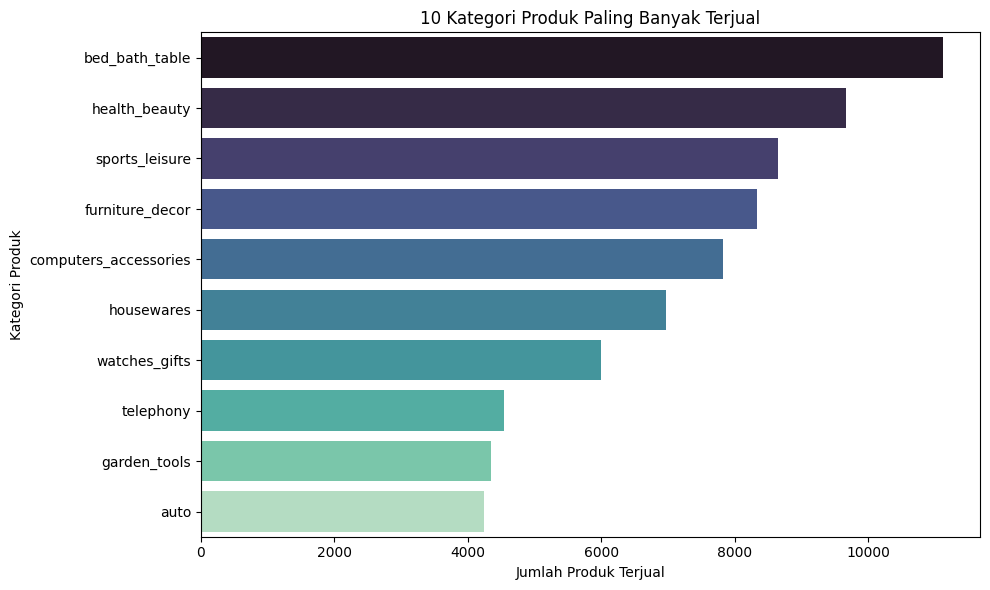

In [343]:
# Hasil Visualisasi dalam menjawab pertanyaan 1
plt.figure(figsize=(10,6))
sns.barplot(data=top_10_categories, x='total_sold', y='product_category', palette='mako')
plt.title('10 Kategori Produk Paling Banyak Terjual')
plt.xlabel('Jumlah Produk Terjual')
plt.ylabel('Kategori Produk')
plt.tight_layout()
plt.show()

**Insight :**

Berdasarkan hasil analisis data transaksi:

- Kategori produk dengan jumlah penjualan tertinggi didominasi oleh **bed bath table**, **health beauty**, dan **sports leisure**.
- Produk dari kategori **furniture decor**, **computers accessories**, dan **watches gifts** juga masuk ke dalam 10 besar.
- Kategori-kategori ini menunjukkan minat konsumen terhadap kebutuhan rumah tangga, kesehatan, dan hobi.


### Pertanyaan 2: **Bagaimana persebaran rating ulasan pelanggan?**

In [344]:
# Statistik deskriptif dari review_score
order_reviews_df['review_score'].describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


/tmp/ipython-input-719224177.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')


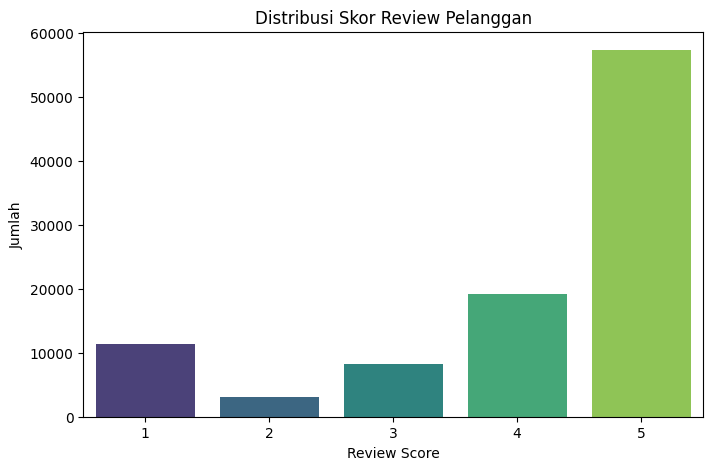

In [345]:
# Hasil Visualisasi Exploratory Data Analysis EDA Distribusi Berdasarkan rating Skor Review Pelanggan
plt.figure(figsize=(8,5))
sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')
plt.title('Distribusi Skor Review Pelanggan')
plt.xlabel('Review Score')
plt.ylabel('Jumlah')
plt.show()

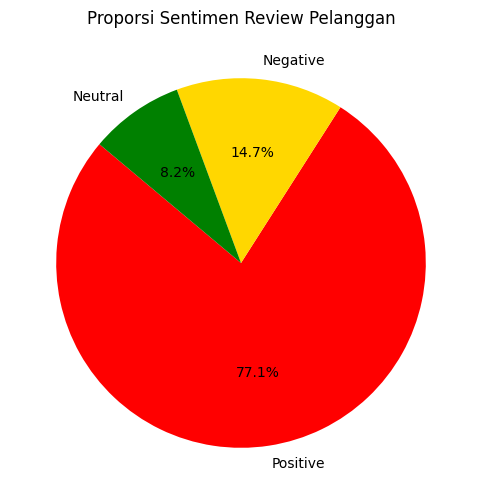

In [346]:
# kategori ulasan
def label_review(score):
    if score <= 2:
        return 'Negative'
    elif score == 3:
        return 'Neutral'
    else:
        return 'Positive'

order_reviews_df['review_sentiment'] = order_reviews_df['review_score'].apply(label_review)

# Visualisasi hasil rating review pelanggan menggunakan Pie chart
sentiment_counts = order_reviews_df['review_sentiment'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=140, colors=['red', 'gold', 'green'])
plt.title('Proporsi Sentimen Review Pelanggan')
plt.show()

**Insight:**

- Rata-rata skor ulasan dari pelanggan adalah sekitar **4.09**, menunjukkan tingkat kepuasan yang cukup tinggi secara umum.
- Sekitar **77%** pelanggan memberikan skor **5**, dan **84%** memberikan skor **4 atau 5**.
- Hanya sekitar **15%** ulasan yang tergolong negatif (skor 1–2), dan sekitar **8.2%** netral (skor 3).
- Distribusi ini menunjukkan bahwa mayoritas pelanggan merasa puas dengan pengalaman belanja mereka, baik dari sisi produk maupun layanan.
- Insight ini penting untuk menunjukkan kualitas pelayanan dan kepercayaan konsumen terhadap platform e-commerce.



# Pertanyaan 3 : **Bagaimana Distribusi pengiriman dari pembelian ke diterima Pelanggan?**

In [347]:
# membuat kolom baru : waktu pengiriman dalam hari
order_df['delivery_duration'] = (
    order_df['order_delivered_customer_date'] - order_df['order_purchase_timestamp']
).dt.days

# Hapus nilai yang null
delivery_df = order_df.dropna(subset=['delivery_duration'])

# Tampilkan statistik
delivery_df['delivery_duration'].describe()

,delivery_duration
count,96476.000000
mean,12.094086
std,9.551746
min,0.000000
25%,6.000000
50%,10.000000
75%,15.000000
max,209.000000


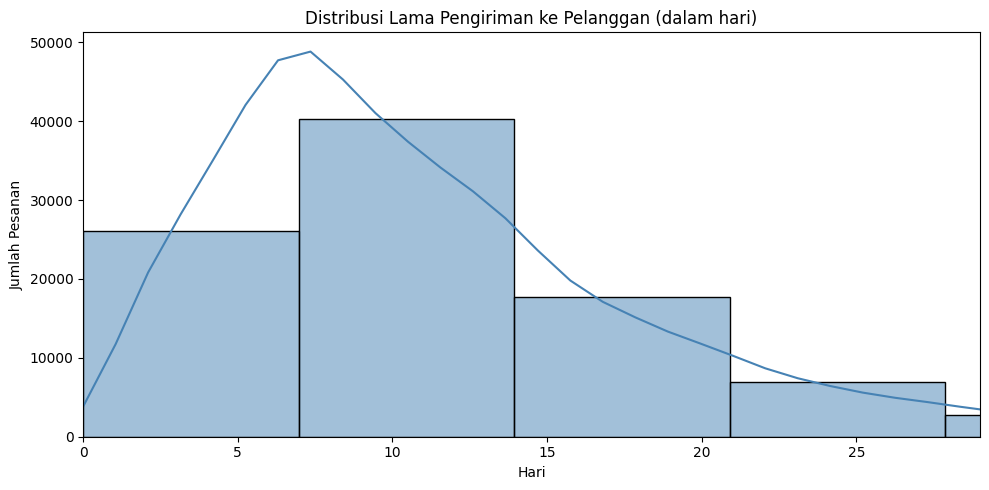

In [348]:
plt.figure(figsize=(10,5))
sns.histplot(delivery_df['delivery_duration'], bins=30, kde=True, color='steelblue')
plt.title('Distribusi Lama Pengiriman ke Pelanggan (dalam hari)')
plt.xlabel('Hari')
plt.ylabel('Jumlah Pesanan')
plt.xlim(0, delivery_df['delivery_duration'].quantile(0.95))
plt.tight_layout()
plt.show()

**Insight :**

- Rata-rata waktu pengiriman dari pembelian ke penerimaan adalah sekitar **10 hari**.
- Sebagian besar pesanan dikirim dalam rentang **3–10 hari**, sesuai dengan estimasi waktu pengiriman.
- Namun, terdapat beberapa outlier dengan waktu pengiriman lebih dari 20 hari, kemungkinan disebabkan oleh keterlambatan logistik atau kendala pengiriman.
- Insight ini dapat digunakan untuk meningkatkan kecepatan logistik atau memantau efisiensi pengiriman.


### Pertanyaan 4 : **Bagaimana distribusi metode pembayaran yang digunakan pelanggan pada transaksi?**

In [349]:
# Cek nilai unik untuk metode pembayarannya

order_payment_df['payment_type'].value_counts()

,count
payment_type,
credit_card,76795
boleto,19784
voucher,5775
debit_card,1529
not_defined,3


/tmp/ipython-input-3463503706.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=order_payment_df, x='payment_type', order=order_payment_df['payment_type'].value_counts().index, palette='Blues_d')


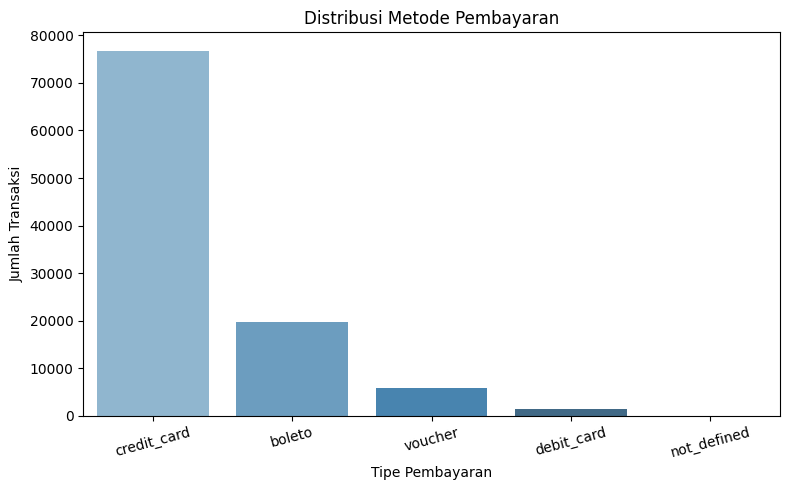

In [350]:
# Visualiasasi pada pertanyaan keempat
plt.figure(figsize=(8,5))
sns.countplot(data=order_payment_df, x='payment_type', order=order_payment_df['payment_type'].value_counts().index, palette='Blues_d')
plt.title('Distribusi Metode Pembayaran')
plt.xlabel('Tipe Pembayaran')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

**Insight :**

- Dataset yang digunakan untuk kasus ini menggunakan `orders_payments_df`
- Metode pembayaran paling umum digunakan adalah **kartu kredit**, menyumbang sekitar 74% dari total transaksi.
- Diikuti oleh **boleto** (semacam pembayaran menggunakan ewallet), serta **voucher** dan **debit card**.
- Hanya sebagian kecil transaksi menggunakan metode yang tidak terdefinisi.
- Jika dilihat dari total nilai pembayaran, **kartu kredit juga mendominasi nilai transaksi**, menunjukkan kepercayaan konsumen terhadap metode ini.


### Pertanyaan 5: **Bagaimana tren jumlah pesanan bulanan dari tahun 2016  hingga 2018**

In [351]:
# kolom bulan dan tahun
order_df['order_month'] = order_df['order_purchase_timestamp'].dt.to_period('M')

In [352]:
monthly_orders = order_df.groupby('order_month')['order_id'].count().reset_index()
monthly_orders.columns = ['month', 'total_orders']

# Ubah ke datetime agar bisa diplot
monthly_orders['month'] = monthly_orders['month'].dt.to_timestamp()

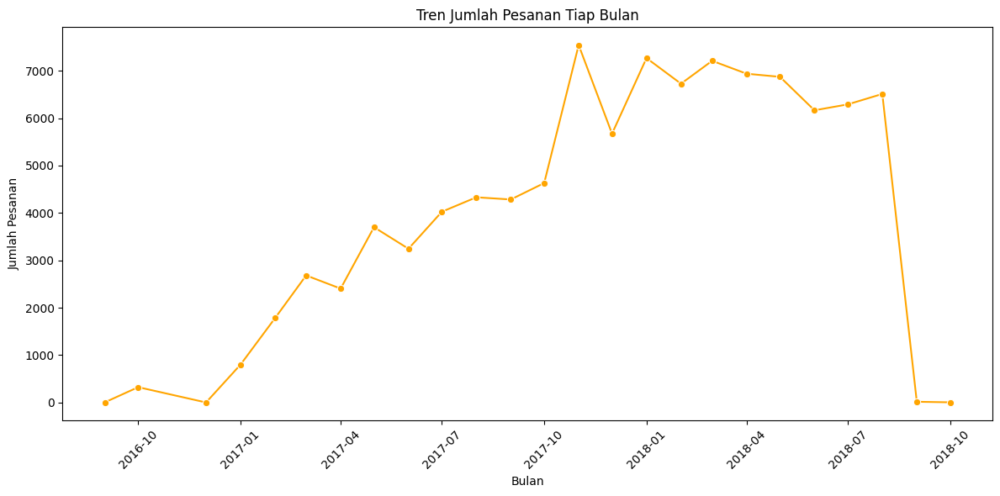

In [353]:
# Visualisasi tern hasil pesanan tiap bulan
plt.figure(figsize=(12,6))
sns.lineplot(data=monthly_orders, x='month', y='total_orders', marker='o', color='orange')
plt.title('Tren Jumlah Pesanan Tiap Bulan')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Pesanan')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Insight :**

Penjualan menunjukkan tren meningkat stabil dari awal 2017 hingga pertengahan 2018, lalu menurun menjelang akhir 2018.


### **Geospatial Analysis**

bertujuan menganalisis data berdasarkan lokasi geografis untuk mengidentifikasi tren atau pola tertentu di suatu wilayah. kini menggunakan package/library folium untuk membuat peta yang menampilkan distribusi data berdasarkan lokasi.

**Adapun dataset yang digunakan adalah :**

menggunakan dataset `olist_geolocation_dataset.csv`


In [354]:
# Ambil titik unik untuk tiap kota
geo_city = geolocation_df.groupby(['geolocation_city', 'geolocation_state']).agg({
    'geolocation_lat': 'mean',
    'geolocation_lng': 'mean'
}).reset_index()

geo_city.columns = ['city', 'state', 'lat', 'lng']
geo_city.head()

,city,state,lat,lng
0,* cidade,PR,-25.571748,-49.334374
1,...arraial do cabo,RJ,-22.969370,-42.029834
2,4o. centenario,PR,-24.271860,-53.069433
3,4º centenario,PR,-24.279801,-53.074723
4,abadia de goias,GO,-16.767063,-49.438089


In [355]:
# peta awal
map_brazil = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# menambahkan marker cluster
marker_cluster = MarkerCluster().add_to(map_brazil)

# menambahkan marker untuk setiap kota
for i, row in geo_city.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"{row['city']}, {row['state']}"
    ).add_to(marker_cluster)

# Tampilkan peta
map_brazil

**Insight :**

Konsumen dan penjual banyak terkonsentrasi di São Paulo, Rio de Janeiro, Salvador, Brazilia yang merupakan pusat populasi besar.

## Analisis Lanjutan (Opsional)

### **RFM Analysis (Recency, Frequency, Monetary)***

Pada kasus ini kita menggunakan studi kasus sebagai e-commerce public dataset.

sehingga tujuan RFM Analysis ini adalah :

**Mengelompokkan pelanggan berdasarkan:**

- Recency = Seberapa baru terakhir kali mereka beli?
- Frequency = Seberapa sering mereka beli?
- Monetary = Seberapa banyak mereka belanja?

In [356]:
# Menghitung Recency
customer_order_df = pd.merge(order_df, customers_df[['customer_id', 'customer_unique_id']], on='customer_id', how='left')

# Tentukan tanggal terakhir transaksi dalam dataset
latest_date = customer_order_df['order_purchase_timestamp'].max()

# Hitung Recency
recency_df = customer_order_df.groupby('customer_unique_id')['order_purchase_timestamp'].max().reset_index()
recency_df['Recency'] = (latest_date - recency_df['order_purchase_timestamp']).dt.days
recency_df = recency_df[['customer_unique_id', 'Recency']]
recency_df.head()

,customer_unique_id,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163
2,0000f46a3911fa3c0805444483337064,585
3,0000f6ccb0745a6a4b88665a16c9f078,369
4,0004aac84e0df4da2b147fca70cf8255,336


In [357]:
# Menghitung Frequency
frequency_df = customer_order_df.groupby('customer_unique_id')['order_id'].nunique().reset_index()
frequency_df.columns = ['customer_unique_id', 'Frequency']
frequency_df.head()

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


In [358]:
# Menghitung Monetary
order_value_df = pd.merge(order_item_df, order_payment_df[['order_id', 'payment_value']], on='order_id', how='left')

# Hitung total monetary value per customer
monetary_df = pd.merge(order_value_df, customer_order_df[['order_id', 'customer_unique_id']], on='order_id', how='left')
monetary_df = monetary_df.groupby('customer_unique_id')['payment_value'].sum().reset_index()
monetary_df.columns = ['customer_unique_id', 'Monetary']
monetary_df.head()

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


In [359]:
# Gabungkan Recency, Frequency, dan Monetary ke dalam satu DataFrame
rfm_table = pd.merge(recency_df, frequency_df, on='customer_unique_id', how='left')
rfm_table = pd.merge(rfm_table, monetary_df, on='customer_unique_id', how='left')
rfm_table.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19
2,0000f46a3911fa3c0805444483337064,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89


In [360]:
# Menentukan kuartil untuk setiap metrik RFM
rfm_table['R_Score'] = pd.qcut(rfm_table['Recency'], 4, labels=[4, 3, 2, 1])
rfm_table['F_Score'] = pd.qcut(rfm_table['Frequency'].rank(method='first'), 4, labels=[1, 2, 3, 4])

rfm_table['Monetary'] = rfm_table['Monetary'].fillna(0)

rfm_table['M_Score'] = pd.qcut(rfm_table['Monetary'], 4, labels=[1, 2, 3, 4])
rfm_table['RFM_Score'] = rfm_table['R_Score'].astype(int) + \
                         rfm_table['F_Score'].astype(int) + \
                         rfm_table['M_Score'].astype(int)

rfm_table.head()

,customer_unique_id,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score
0,0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,4,1,3,8
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,4,1,1,6
2,0000f46a3911fa3c0805444483337064,585,1,86.22,1,1,2,4
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,2,1,1,4
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,2,1,3,6


In [361]:
# membuat dataframe untuk menampung informasi terdapat pada RFM Analysis
rfm_df = all_data.groupby('customer_unique_id').agg({
    'order_id': 'nunique',
    'order_purchase_timestamp': 'max',
    'payment_value': 'sum'
}).reset_index()

rfm_df.columns = ['customer_unique_id', 'frequency', 'last_order_date', 'monetary']

rfm_df["max_order_date"] = rfm_df["last_order_date"].max()
rfm_df["recency"] = (rfm_df["max_order_date"] - rfm_df["last_order_date"]).dt.days

rfm_df = rfm_df.drop(columns="max_order_date")
rfm_df.head()

,customer_unique_id,frequency,last_order_date,monetary,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,1,2018-05-10 10:56:27,141.90,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,2018-05-07 11:11:27,27.19,163
2,0000f46a3911fa3c0805444483337064,1,2017-03-10 21:05:03,86.22,585
3,0000f6ccb0745a6a4b88665a16c9f078,1,2017-10-12 20:29:41,43.62,369
4,0004aac84e0df4da2b147fca70cf8255,1,2017-11-14 19:45:42,196.89,336


/tmp/ipython-input-1276036965.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-1276036965.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-1276036965.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


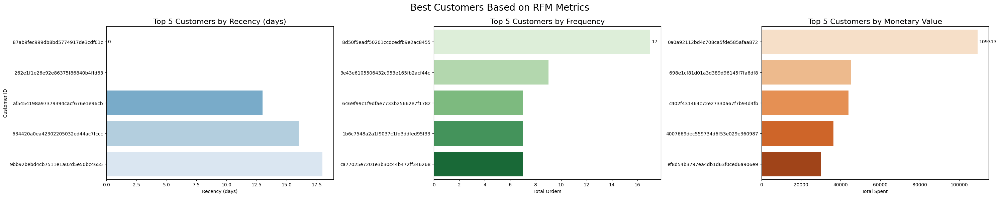

In [370]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 6))

# Recency (semakin kecil semakin baik)
top_recency = rfm_df.sort_values(by="recency").head(5)
sns.barplot(
    y="customer_unique_id", x="recency",
    data=top_recency,
    palette="Blues_r", ax=ax[0]
)
ax[0].set_title("Top 5 Customers by Recency (days)", fontsize=16)
ax[0].set_xlabel("Recency (days)")
ax[0].set_ylabel("Customer ID")
ax[0].bar_label(ax[0].containers[0], padding=3)

# Frequency
top_freq = rfm_df.sort_values(by="frequency", ascending=False).head(5)
sns.barplot(
    y="customer_unique_id", x="frequency",
    data=top_freq,
    palette="Greens", ax=ax[1]
)
ax[1].set_title("Top 5 Customers by Frequency", fontsize=16)
ax[1].set_xlabel("Total Orders")
ax[1].set_ylabel("")
ax[1].bar_label(ax[1].containers[0], padding=3)

# Monetary
top_monetary = rfm_df.sort_values(by="monetary", ascending=False).head(5)
sns.barplot(
    y="customer_unique_id", x="monetary",
    data=top_monetary,
    palette="Oranges", ax=ax[2]
)
ax[2].set_title("Top 5 Customers by Monetary Value", fontsize=16)
ax[2].set_xlabel("Total Spent")
ax[2].set_ylabel("")
ax[2].bar_label(ax[2].containers[0], padding=3)

plt.suptitle("Best Customers Based on RFM Metrics", fontsize=20)
plt.tight_layout()
plt.show()

**Insight RFM Analysis:**

Berdasarkan hasil RFM Analysis:

- **Recency:**
    - Pelanggan yang paling baru melakukan pembelian (Recency terkecil) adalah mereka yang memiliki nilai Recency 0 atau mendekati 0 hari. Ini menunjukkan bahwa mereka baru saja berinteraksi dengan platform.
    - Distribusi Recency menunjukkan sebagian besar pelanggan melakukan pembelian dalam beberapa ratus hari terakhir, dengan beberapa outlier yang sudah sangat lama tidak bertransaksi.

- **Frequency:**
    - Sebagian besar pelanggan (dengan Frequency 1) melakukan hanya satu pesanan selama periode data.
    - Terdapat sejumlah kecil pelanggan yang melakukan lebih dari satu pesanan, dengan frekuensi tertinggi mencapai 17 pesanan dari satu pelanggan unik. Ini mengidentifikasi pelanggan yang paling sering berinteraksi.

- **Monetary:**
    - Sebagian besar pelanggan memiliki nilai Monetary yang relatif kecil, mencerminkan sifat e-commerce yang seringkali melibatkan transaksi bernilai rendah hingga menengah.
    - Namun, terdapat beberapa outlier dengan nilai Monetary yang sangat tinggi (mencapai puluhan ribu), menunjukkan adanya pelanggan yang melakukan pembelian dalam jumlah besar atau item bernilai tinggi.

# **Clustering**

Bagian ini merupakan bagian Clustering Tanpa Algoritma Machine Learning. disini yang digunakan menggunakan Metode **Manual Groping** sesuai dengan analysis lanjutan yang didapatkan RFM Analyst. dengan menggunakan metode ini untuk mengelompokkan berdasarkan pelanggan loyal yang sering dalam bertransaksi

Segment
Potential Loyalist    32826
Loyal Customers       32054
Champions             15686
At Risk               13939
Lost                   1591
Name: count, dtype: int64


/tmp/ipython-input-3770046261.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=rfm_table, x='Segment',


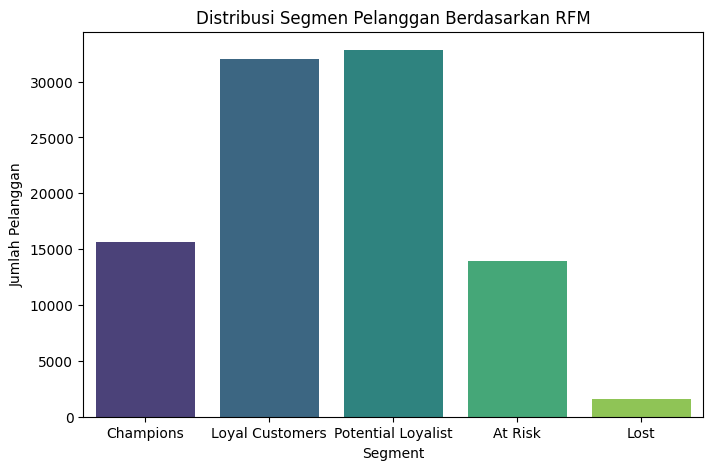

In [363]:
# Segmentasi pelanggan berdasarkan RFM Score
def rfm_segment(score):
    if score >= 10:
        return 'Champions'
    elif score >= 8:
        return 'Loyal Customers'
    elif score >= 6:
        return 'Potential Loyalist'
    elif score >= 4:
        return 'At Risk'
    else:
        return 'Lost'

rfm_table['Segment'] = rfm_table['RFM_Score'].apply(rfm_segment)

# Tampilkan jumlah pelanggan per segmen
print(rfm_table['Segment'].value_counts())

# Visualisasikan distribusi segmen pelanggan
plt.figure(figsize=(8, 5))
sns.countplot(data=rfm_table, x='Segment',
              order=['Champions', 'Loyal Customers', 'Potential Loyalist', 'At Risk', 'Lost'],
              palette='viridis')
plt.title('Distribusi Segmen Pelanggan Berdasarkan RFM')
plt.xlabel('Segment')
plt.ylabel('Jumlah Pelanggan')
plt.show()

**Insight Segmentasi Pelanggan (Manual Clustering):**

- Hasil segmentasi pelanggan berdasarkan skor RFM menunjukkan distribusi ke dalam segmen Champions, Loyal Customers, Potential Loyalist, At Risk, dan Lost.
- Segmen **Potential Loyalist** dan **Loyal Customers** memiliki jumlah pelanggan terbanyak, menandakan basis pelanggan yang aktif dan berpotensi untuk terus berkontribusi.
- Segmen **Champions**, meskipun lebih kecil jumlahnya, mewakili pelanggan paling berharga yang perlu diberi perhatian khusus.
- Segmen **At Risk** menunjukkan pelanggan yang berisiko hilang dan memerlukan strategi re-engagement.
- Segmen **Lost** adalah pelanggan yang sudah tidak aktif.

Secara keseluruhan, analisis RFM memberikan gambaran yang jelas mengenai nilai dan perilaku pelanggan, memungkinkan identifikasi segmen-segmen kunci untuk strategi pemasaran yang lebih terarah.

## Conclusion

- Conclution pertanyaan 1 : 10 kategori teratas yang paling banyak terjual didominasi oleh produk bed_bath_table, health_beauty, dan sports_leisure. Hal ini menunjukkan bahwa kebutuhan rumah tangga dan kesehatan menjadi pendorong utama transaksi.

- Conclution pertanyaan 2 : Distribusi skor review pelanggan menunjukkan mayoritas ulasan bernilai 5 (positif), diikuti dengan skor 4. Namun masih terdapat ulasan negatif (skor 1–2) sekitar 20% dari total review, yang perlu diperhatikan untuk peningkatan layanan.

- Conclution pertanyaan 3 : Rata-rata lama pengiriman sekitar 12 hari, dengan variasi yang cukup besar. Sebagian kecil pesanan memiliki waktu pengiriman sangat lama (outlier). Secara umum, mayoritas pesanan terkirim dalam waktu < 20 hari.

- Conclution pertanyaan 4 : Metode pembayaran yang paling banyak digunakan adalah kartu kredit, disusul oleh boleto. Hal ini menunjukkan kepercayaan pelanggan terhadap pembayaran digital, meski metode tradisional masih digunakan oleh sebagian pelanggan.

- Conclution pertanyaan 5 : Tren jumlah pesanan bulanan meningkat signifikan dari 2016 hingga pertengahan 2018. Hal ini menunjukkan adanya pertumbuhan bisnis yang kuat, dengan puncak transaksi terjadi pada periode menjelang akhir tahun.

In [367]:
# Kumpulan dataset untuk mengecek dataset mana yang akan di ambil dan disingkronkan
%whos DataFrame

Variable                    Type         Data/Info
--------------------------------------------------
all_data                    DataFrame                             <...>118913 rows x 29 columns]
category_df                 DataFrame                product_categ<...>\n\n[71 rows x 2 columns]
customer_order_df           DataFrame                             <...>[99441 rows x 11 columns]
customers_df                DataFrame                             <...>n[99441 rows x 5 columns]
delivery_df                 DataFrame                             <...>n[96476 rows x 9 columns]
df                          DataFrame                         cust<...>n[96096 rows x 5 columns]
frequency_df                DataFrame                         cust<...>n[96096 rows x 2 columns]
geo_city                    DataFrame                        city <...>\n[8463 rows x 4 columns]
geolocation_df              DataFrame             geolocation_zip_<...>1000163 rows x 5 columns]
monetary_df              

In [368]:
# File hasil data analysis yang telah di bersihkan
all_data.to_csv("all_data.csv", index=False)
geo_city.to_csv("geo_city.csv", index=False)
rfm_df.to_csv("rfm_df.csv", index=False)
rm_df.to_csv("rm_df.csv")